# Introduction to MIIT

This notebook serves as an introduction and tutorial into the MIIT framework and how to integrate several spatial omcis techniques.

Although the focus of the publication is the spatial integration of spatial transcriptomics (Visium arrays; ST) data and mass spectrometry imaging by MALDI-TOF MSI (MSI), MIIT supports a variety of other types of spatial data. This notebook is written to be very verbose to include some of those additional data types as they were part of integration performed in the article.

A shorter, more concise notebook can be found in "06_reviewer_notebook_short.ipynb". 

This notebook is designed such that at the end of each section, the result is saved to file and reloaded at the beginning of the next step. By doing so, each  section can be executed separately. Also note, that some of the steps in the notebook are alternatives and do not need to be executed separately.

Tabel of Content:

1. Loading data and MIIT datatypes
- Loading base data types
- Loading spatial omics data types
- Merging different spatial omics data into a compound `Section` object.

2. Registration
- Registration using GreedyFHist standalone.
- Using MIIT to register serial sections with GreedyFHist.

3. Transformation
- Transforming MSI counts to ST spots.
- Transforming tissue type annotations to ST spots.

4. Export
- Exporing integrated MSI spots and integrated tissue type annotations to file.

5. Proof-of-Concept analysis.
- Generating plots from the proof-of-concept analysis.

What to do here?

- Show plotting analysis from paper.
- Finish up documentation/ API docs?

- Add name attribute to visium and imzml?
- Do I need to add spatialdataloader to section load?

In [1]:
import glob
import os
from os.path import exists, join
from typing import Optional

import pandas, pandas as pd
import numpy, numpy as np

import matplotlib.pyplot as plt

from greedyfhist.registration import GreedyFHist
from greedyfhist.options import RegistrationOptions
from miit.utils.metrics import compute_tre
from miit.registerers import GreedyFHistExt
from miit.spatial_data.spatial_omics import Visium, Imzml
from miit.spatial_data.section import groupwise_registration, register_to_ref_image, Section

from miit.spatial_data.spatial_omics.imzml import (
    get_metabolite_intensities_targeted, 
    get_metabolite_intensities_from_full_spectrum,
    msi_default_accumulate_spot_weighted_mean, 
    msi_default_spot_accumulation_fun,
    
)
from miit.spatial_data.spatial_omics.visium import convert_table_to_mat
from miit.integration.integration import (
    get_mappings, 
    map_mapping_index_to_table_index, 
    accumulate_counts,
    integrate_annotations
)
from pyimzml.ImzMLParser import ImzMLParser

from helper_functions import (
    load_sections, load_section, plot_sections, plot_registration_summary, make_wrong_integration_section,
    get_spot_coloring_img
)

Abbreviations:

- HES = Hematoxylin-Erythrosine-Saffron
- HE = Hematoxylin-Eosin
- MTS = Masson's Trichrome Staining
- IHC = Immunohistochemistry

## Loading Data and MIIT datatypes

In this section, we load data and introduce the different data types that MIIT uses.

Dataset description:
- 9 serial histology sections with the following stains: (HES, HE, HES, HES, HES, MTS, IHC, IHC, HES)
- Each serial section contains: 
  - landmarks with matching labels across all sections.
  - semi-manually generated tissue masks 
- Section 2 contain spatial transcriptomics data and additional histology classifications.
- Sections 6 and 7 contain imzml data that were generated with MALDI-MSI.


MIIT datatypes:

In order to manage the variety of different datatypes, MIIT uses wrapper classes that help with spatial transformations and registration operations. MIIT's wrapper classes can be devided into `basetypes` and more advanved `spatial-omics-types`. Currently, MIIT offers the following `baseclasses`:
`Image`, `Annotation`, `Pointset`, `GeoJSONData`, `OMETIFFImage`, `OMETIFFAnnotation`. And the following `so_classes`: `Visium` and `Imzml`. MIIT also has a composited class `Section` that can be used to compound multiple types of spatial data in the same image space.
In this tutorial only `Image`, `Annotation`, `Pointset`, `Visium` and `Imzml` are used.

`Image` is the default type applicable for most image types. 

`Annotation` is the data types equipped for dealing with annotation data. Data can either be 2 or 3 dimensional and uses nearest neighbor interpolation for image transformations.

`Pointset` is used for tabular data. Internally, pointset data is stored as a pandas DataFrame. Each datapoint can be associated with additional properties (i.e. columns in the DataFrame).

`Visium`:

`Imzml`:

In [2]:
section_directory = '../../../../Documents/miit_test_data/test_data_publication/source_data'
warped_section_directory = '../../../../Documents/miit_test_data/test_data_publication/warped_sections'
integrated_data_directory = '../../../../Documents/miit_test_data/test_data_publication/integrated_data'

In [3]:
os.listdir(section_directory)

['7', '9', '11', '8', '2', '10', '1', '6', '3']

In [4]:
sections = load_sections(section_directory)

/home/maxi/mambaforge/envs/miit/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


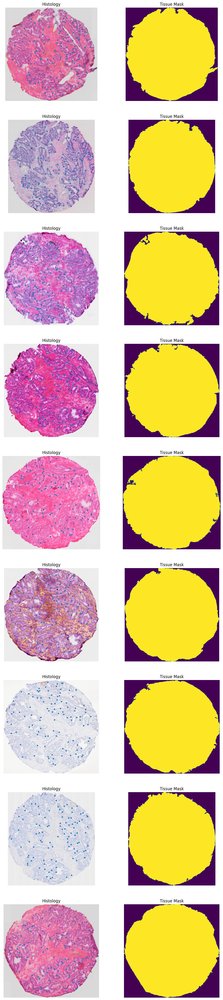

In [5]:
# Here we plot each histology image along with tissue masks and landmarks.
plot_sections(sections)

In [6]:
section_list = list(sections.values())
len(section_list)

9

### Data types - Loading spatial transcriptomics

One of the two main types of spatial omics data is spatial transcriptomics. MIIT implements the `Visium` type from 10X Genomics. We show in a short example on how to load a `Visium` data and connect it to sections. MIIT assumes that ST data has been preprocessed with `spaceranger`.

In [9]:
# First we load Visium from the preprocessed directory.
st = Visium.from_spcrng(join(section_directory, '2', 'spatial_transcriptomics'))

Text(0.5, 1.0, 'Histology section used for other processing.')

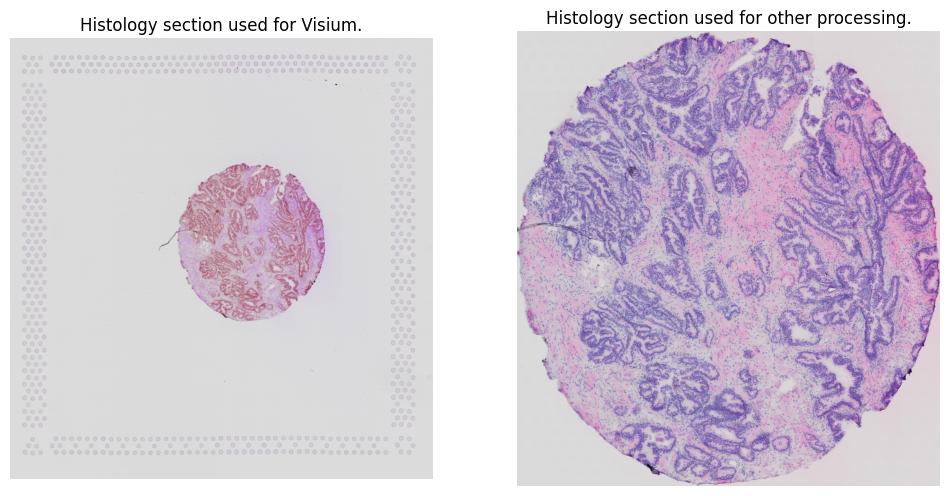

In [10]:
fig, axs = plt.subplots(1, 2, figsize=(6 * 2, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st.image.data)
axs[0].set_title('Histology section used for Visium.')
axs[1].imshow(sections['2'].reference_image.data)
axs[1].set_title('Histology section used for other processing.')

In some cases, spatial transcriptomics was mapped to a differently cropped version of the histology than the histology used in the section. In order to map spatial transcriptomics data to the image space of the reference image in the section, we provide a small helper function, `register_to_ref_image`.

In [11]:
warped_st_data, registered_st_image = register_to_ref_image(target_image=sections['2'].reference_image.data,
                                                            source_image=st.image.data,
                                                            data=st)

Text(0.5, 1.0, 'Registered Visium Histology')

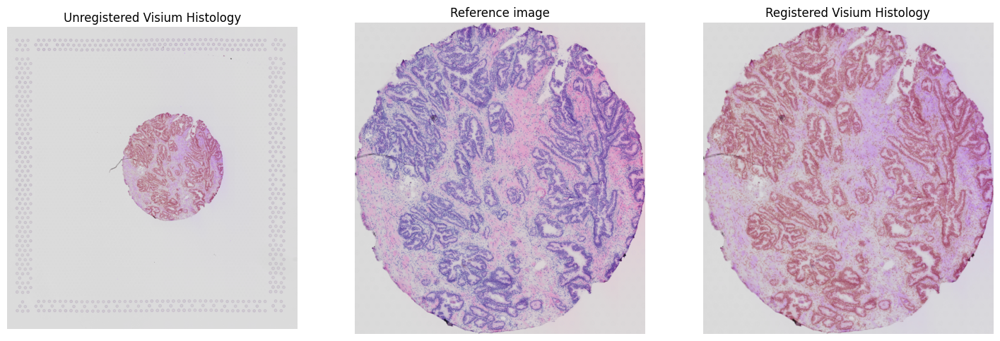

In [12]:
fig, axs = plt.subplots(1, 3, figsize=(6 * 3, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st.image.data)
axs[0].set_title('Unregistered Visium Histology')
axs[1].imshow(sections['2'].reference_image.data)
axs[1].set_title('Reference image')
axs[2].imshow(registered_st_image.data)
axs[2].set_title('Registered Visium Histology')

In [13]:
sections['2'].so_data.append(warped_st_data)

In [14]:
sections['2'].print_additional_data_summary()

######################################################################
# Name           # ID                                   # Type       #
######################################################################
# tissue_mask    # f77385de-7b82-11ef-8f52-00155d23a1bb # annotation #
# landmarks      # f773fb40-7b82-11ef-8f52-00155d23a1bb # pointset   #
# tissue_classes # f7b32090-7b82-11ef-8f52-00155d23a1bb # annotation #
#                # 37040be2-7b83-11ef-8f52-00155d23a1bb # visium     #
#                # 7c1fcc98-7b83-11ef-8f52-00155d23a1bb # visium     #
######################################################################


### Data types - Loading imzml data.

The other important datatype in MIIT is Imzml data. We provide an initialization function, that loads msi data from imzml and registers it to a reference image. By default, MIIT derives an image presentation from imzml data using the principal component analysis. If no accurate presentation can be derived from the msi data, alternatively srd annotation from Scils can also be used as a placeholder.

In [15]:
# Imzml
msi_pos_paths = glob.glob(join(section_directory, '6', 'imzml', '*'))
msi_pos_imzml_path = [x for x in msi_pos_paths if x.endswith('imzML')][0]
msi_pos_srd_path = [x for x in msi_pos_paths if x.endswith('srd')][0]
msi_pos_ibd_path = [x for x in msi_pos_paths if x.endswith('ibd')][0]
msi_pos_section = sections['6']
msi_pos = Imzml.load_msi_data(
    image=msi_pos_section.reference_image,
    imzml_path=msi_pos_imzml_path,
    name='msi_pos',
    srd_path=msi_pos_srd_path,
    use_srd=True
)

/home/maxi/mambaforge/envs/miit/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


In [16]:
sections['6'].so_data.append(msi_pos)

In [17]:
sections['6'].print_additional_data_summary()

###################################################################
# Name        # ID                                   # Type       #
###################################################################
# tissue_mask # f810d1a4-7b82-11ef-8f52-00155d23a1bb # annotation #
# landmarks   # f8111f10-7b82-11ef-8f52-00155d23a1bb # pointset   #
# msi_pos     # 01797f20-7b83-11ef-8f52-00155d23a1bb # Imzml      #
# msi_pos     # 85b2834a-7b83-11ef-8f52-00155d23a1bb # Imzml      #
###################################################################


## Registration

The next section deals with the topic of registration. MIIT comes with a variety of registration algorithms for different purposes, but for the registration of serial sections we use the custom developed GreedyFHist algorithm (githum.com/mwess/greedyfhist). 

GreedyFHist can be used as a standalone tool or within MIIT. We will show examples for both applications.

In [19]:
sections = load_sections(section_directory)

/home/maxi/mambaforge/envs/miit/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


### Registration - GreedyFHist standalone

In [20]:
moving_section = section_list[0]
fixed_section = section_list[1]

use_manual_tissue_masks = False

moving_image = moving_section.reference_image.data
fixed_image = fixed_section.reference_image.data

if use_manual_tissue_masks:
    moving_img_mask = moving_section.get_annotations_by_names('tissue_mask').data
    fixed_img_mask = fixed_section.get_annotations_by_names('tissue_mask').data
else:
    moving_img_mask = None
    fixed_img_mask = None

moving_lms = moving_section.get_annotations_by_names('landmarks').data
fixed_lms = fixed_section.get_annotations_by_names('landmarks').data

options = RegistrationOptions()
# We achieved the fastes registration when setting n_threads to 8. 
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

GreedyFHist relies internally on the greedy tool. GreedyFHist can work with greedy either as an installed commandline application or as a docker executable. 

When greedy is installed as a commandline application, GreedyFHist needs the path to greedy. If greedy is on the PATH variable, no path needs to be provided. If greedy is used as a docker container executable, set path_to_greedy as the image name and set use_docker_container to True.

Note: If MIIT, GreedyFHist and greedy are all in a docker environment, path_to_greedy can be treated normally.

In [21]:
# Comment out the applicable initialization.

# When using greedy as a commandline application. (We assume that greedy is on PATH.)
# registerer = GreedyFHist()

# When using greedy through a docker container executable.
registerer = GreedyFHist(path_to_greedy='mwess89/greedy:1.3.0-alpha', use_docker_container=True)


In [22]:
registration_result = registerer.register(
    moving_img=moving_image,
    fixed_img=fixed_image,
    options=options
)

In [23]:
# We can use the computed registration_result to warp images to the fixed image space.
warped_image = registerer.transform_image(moving_image, registration_result.registration.forward_transform)
warped_lms = registerer.transform_pointset(moving_lms[['x', 'y']].to_numpy(), registration_result.registration.backward_transform)
warped_lms = pd.DataFrame(warped_lms, columns=['x', 'y'])
warped_lms['label'] = moving_lms['label'].copy()

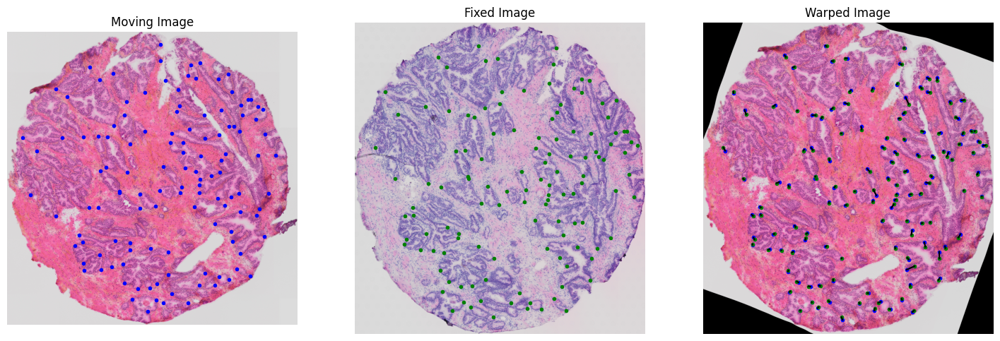

In [24]:
plot_registration_summary(moving_image,
                          fixed_image,
                          warped_image,
                          moving_lms,
                          fixed_lms,
                          warped_lms,
                          plot_lm_distance=True)

## Registration - Using MIIT

We could see in the last section, that warping one image and one set of landmarks already requires a few lines. With more data types this can be become increasingly cumbersome to keep track of. Therefor, we added wrapper classes for registration algorithms to MIIT, with the goal of easing the complexity of handling multiple data types. 

In [4]:
# GreedyFHists wrapper class 'GreedyFHistExt' can be initialized with the same arguments as GreefyFHist.
gfh_ext = GreedyFHistExt.init_registerer(path_to_greedy='mwess89/greedy:1.3.0-alpha',
                                         use_docker_container=True)

In [26]:
# GreedyFHistExt can be called very similarly to GreedyFHist.

moving_section = section_list[0]
fixed_section = section_list[1]

options = RegistrationOptions()
options.affine_registration_options.n_threads = 8
options.nonrigid_registration_options.n_threads = 8

registration_result = gfh_ext.register_images(moving_img=moving_section.reference_image.data,
                                              fixed_img=fixed_section.reference_image.data,
                                              options=options)

In [27]:
# After successful registration, we only need to pass, the registration_result and the associated
# registerer to the moving section and all data within the section is transformed to the fixed image space.
warped_section = moving_section.apply_transform(gfh_ext, registration_result)

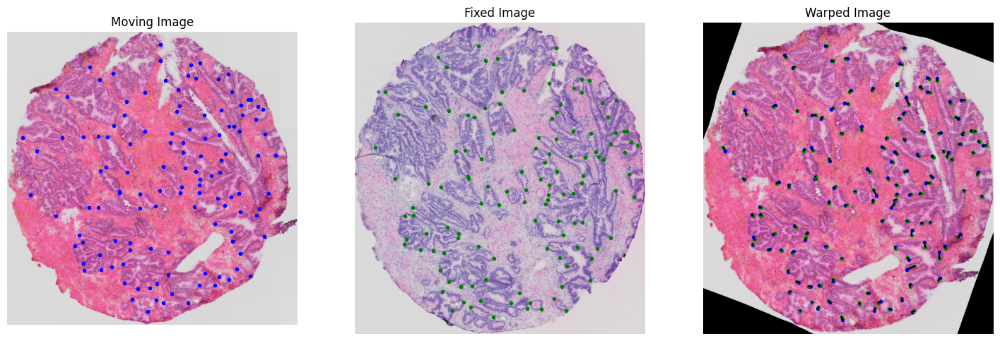

In [28]:
plot_registration_summary(
    moving_section.reference_image.data,
    fixed_section.reference_image.data,
    warped_section.reference_image.data,
    moving_section.get_annotations_by_names('landmarks').data,
    fixed_section.get_annotations_by_names('landmarks').data,
    warped_section.get_annotations_by_names('landmarks').data,
    plot_lm_distance=True
)

In [30]:
mean_rtre, median_rtre, mean_tre, median_tre = compute_tre(warped_section.get_annotations_by_names('landmarks').data, 
            fixed_section.get_annotations_by_names('landmarks').data,
            fixed_section.reference_image.data.shape)
print(f'Mean rtre: {mean_rtre}')
print(f'Median rtre: {median_rtre}')
print(f'Mean tre: {mean_tre}')
print(f'Median tre: {median_tre}')

(0.004625382231073211,
 0.0037894515625403443,
 19.240703343926096,
 15.763392020057665)

## Registration - Groupwise registration

GreedyFHist has a groupwise registration option that registers multiple images at once. We show here on how to use it in MIIT. 

At this moment, no other groupwise registration methods have been implented into MIIT.

In [8]:
options = RegistrationOptions()
options.affine_registration_options.n_threads = 4
options.nonrigid_registration_options.n_threads = 4

# We invert the list, because the last section in the list is by convention the fixed section
# and in this example, we want section[1] to be the fixed section.
section_list_ = [section_list[1], section_list[3], section_list[4]][::-1]

warped_sections, transforms = groupwise_registration(section_list_, gfh_ext, options=options)

: 

Text(0.5, 1.0, 'Fixed Image')

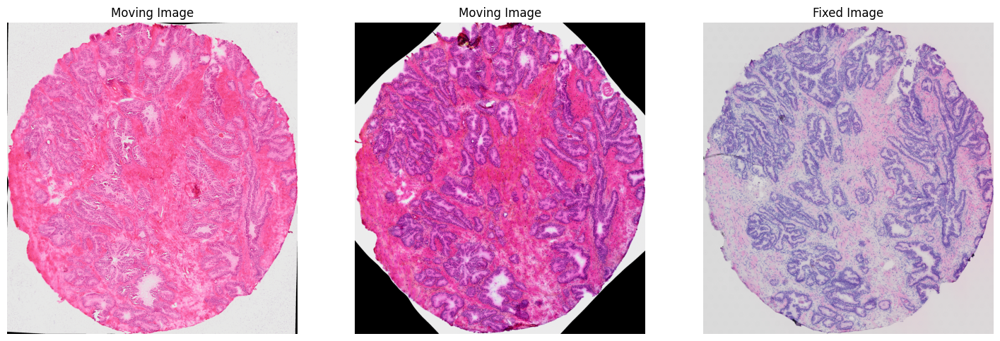

In [ ]:
fig, axs = plt.subplots(1, len(warped_sections), figsize=(6 * len(warped_sections), 6 * 1))
for ax in axs:
    ax.axis('off')
for idx, section in enumerate(warped_sections[:-1]):
    axs[idx].imshow(warped_sections[idx].reference_image.data)
    axs[idx].set_title('Moving Image')
axs[-1].imshow(warped_sections[-1].reference_image.data)
axs[-1].set_title('Fixed Image')

In [ ]:
st_section = warped_sections[2]
msi_pos_section = warped_sections[1]
msi_neg_section = warped_sections[0]

st_section.store(join(warped_section_directory, 'st_section'))
msi_pos_section.store(join(warped_section_directory, 'msi_pos_section'))
msi_neg_section.store(join(warped_section_directory, 'msi_neg_section'))

## Transforming registered sections.

In [4]:
# This is an optional step in which we register the imaging data necessary for the following integration.
# This step can also be skipped and the data can be loaded directly.

sections = load_sections(section_directory)

st_section = sections['2']
msi_pos_section = sections['6']
msi_neg_section = sections['7']


gfh_ext = GreedyFHistExt.init_registerer(path_to_greedy='mwess89/greedy:1.3.0-alpha',
                                         use_docker_container=True)

options = RegistrationOptions()
options.affine_registration_options.n_threads = 4
options.nonrigid_registration_options.n_threads = 4

registration_result = gfh_ext.register_images(msi_pos_section.reference_image.data,
                              st_section.reference_image.data,
                              options=options)

warped_msi_pos_section = msi_pos_section.apply_transform(gfh_ext, registration_result)

registration_result = gfh_ext.register_images(msi_neg_section.reference_image.data,
                                              st_section.reference_image.data,
                                              options=options)

warped_msi_neg_section = msi_neg_section.apply_transform(gfh_ext, registration_result)

st_section.store(join(warped_section_directory, 'st_section'))
warped_msi_pos_section.store(join(warped_section_directory, 'msi_pos_section'))
warped_msi_neg_section.store(join(warped_section_directory, 'msi_neg_section'))

/home/maxi/mambaforge/envs/miit/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


: 

In [13]:
# Load warped data
st_section = Section.load(join(warped_section_directory, 'st_section'))
msi_pos_section = Section.load(join(warped_section_directory, 'msi_pos_section'))
msi_neg_section = Section.load(join(warped_section_directory, 'msi_neg_section'))

Step 1: Find overlap between reference matrix. By default, 0 is assumed to denote the background in each reference matrix. `get_mappings` returns:

- `mapping`: a dictionary that maps for every unique reference id in the source reference matrix, the reference ids (including counts) in the target reference matrix. 
- `spots_background`: for each unique id in the source reference matrix the amount of overlap with background noise in the target reference matrix.
- `unique_target_reference`: A list of unique target references that have overlap with the source reference ids. 

In [14]:
st_data = st_section.so_data[0]
msi_pos_data = msi_pos_section.so_data[0] 
mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_pos_data.ref_mat.data, st_data.background, msi_pos_data.background)

Step 2: We extract all intensities from the imzml file. We use the list unique references to only extract pixels which will be relevant for the subsequent merging. 
Row indices indicate the spectrum  and columns indices refer to the enumerated msi-pixels.

In [15]:
msi_pixel_idxs = msi_pos_data.set_map_to_msi_pixel_idxs(unique_target_reference)
msi_mappings = msi_pos_data.mappings_map_to_msi_pixel_idxs(mappings)
msi = ImzMLParser(msi_pos_data.config['imzml'])
metabolites_pos_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, ['Spermine'])
metabolites_pos_df.head()

/home/maxi/mambaforge/envs/miit/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


,0,1,2,3,4,5,6,8,9,10,...,7358,7359,7360,7361,7363,7364,7365,7366,7368,7370
Spermine,7.188809,11.81903,10.141033,8.22156,6.471012,6.866689,7.327454,10.519325,9.508928,11.001272,...,43.905319,38.407833,87.067154,61.317364,51.610725,43.192768,45.492889,46.168293,37.584633,60.725632


Step 3: We use the msi data and overlapping areas to accumulate the counts over the shared spatial transcriptomics spots.

In this example, we compute the weighted mean to accumulate spots using `msi_default_accumulate_spot_weighted_mean`. 

In [16]:
accumulated_df = accumulate_counts(msi_mappings, metabolites_pos_df, spots_background, msi_default_accumulate_spot_weighted_mean)
integrated_pos_df = map_mapping_index_to_table_index(accumulated_df, st_data)
integrated_pos_df.head()

,Spermine
ATATCCGGGAAGACTG-1,0.0
CTCAAGACGCAGGCTG-1,0.0
GCAAAAATCAAGGCTC-1,0.0
CGAGCACAGGTGCAGT-1,0.0
ATCGGTCCGTCACGGC-1,0.0


In [17]:
# Transforming MSI in negative ion mode.

st_data = st_section.so_data[0]
msi_neg_data = msi_neg_section.so_data[0] 
mappings, spots_background, unique_target_reference = get_mappings(st_data.ref_mat.data, msi_neg_data.ref_mat.data, st_data.background, msi_neg_data.background)

msi_pixel_idxs = msi_neg_data.set_map_to_msi_pixel_idxs(unique_target_reference)
msi_mappings = msi_neg_data.mappings_map_to_msi_pixel_idxs(mappings)
msi = ImzMLParser(msi_neg_data.config['imzml'])
metabolites_neg_df = get_metabolite_intensities_targeted(msi, msi_pixel_idxs, ['Zinc', 'Citrate'])
accumulated_df = accumulate_counts(msi_mappings, metabolites_neg_df, spots_background, msi_default_accumulate_spot_weighted_mean)
integrated_neg_df = map_mapping_index_to_table_index(accumulated_df, st_data)
integrated_neg_df

/home/maxi/mambaforge/envs/miit/lib/python3.10/site-packages/pyimzml/ontology/ontology.py:92: UserWarning: Accession IMS:1000046 found with incorrect name "pixel size x". Updating name to "pixel size (x)".
  warn(


,Zinc,Citrate
ATATCCGGGAAGACTG-1,0.0,0.0
CTCAAGACGCAGGCTG-1,0.0,0.0
GCAAAAATCAAGGCTC-1,0.0,0.0
CGAGCACAGGTGCAGT-1,0.0,0.0
ATCGGTCCGTCACGGC-1,0.0,0.0
...,...,...
ACCGTACGATAGGTCT-1,0.0,0.0
CGGATGCTCAAAGAGA-1,0.0,0.0
ACTCCCAGCTAGGATC-1,0.0,0.0
GTGGTTGAGGTATACG-1,0.0,0.0


### Integrating annotations

MIIT can also be used to integration annotations over spatial omics data. The result returns for each unique datapoint in the spatial omics data a value between 0 and 1 to indicate how much area is covered by the given annotations.

In [12]:
msi_pos_integrated_annotations = integrate_annotations(st_data, msi_pos_section.get_annotations_by_names('tissue_classes'))
msi_pos_integrated_annotations.head()

,empty*,Tumor,stroma,Immune cells,Necrosis,Other,Region*,Ignore*,gland,tissue,...,Benign hyperplasia (BH),what_is_this,Gleason 4,Normal epithel,maybe Lymfocytter,ISUP4 but uncertain low Qual stain,check this ISUP 4,ISUP 1 or 4 - uncertain further IHC needed p63,ISUP 3 or 5 - uncertain due to stain quality,lymfocytt-enriched stroma
CGTGCCCAGTCCCTTT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GACTCGTAGGTATTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CGAAAAACTCCGTAGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
GATTTAGGCGGGAATA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CTTCAGCCAGTAACGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAACACTATAGATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGGTTTCCTCCCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CCCTTTGATCGCGTTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTCGTAGGATCAACTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
msi_neg_integrated_annotations = integrate_annotations(st_data, msi_neg_section.get_annotations_by_names('tissue_classes'))
msi_neg_integrated_annotations.head()

IndexError: index 19 is out of bounds for axis 2 with size 19

In [ ]:
st_integrated_annotations = integrate_annotations(st_data, st_section.get_annotations_by_names('tissue_classes'))
st_integrated_annotations.head()

## Export

Exporting integrated data is simple for integrated counts in the spatial transcriptomics image space and can be done using pandas. 

In [20]:
integrated_neg_df.to_csv(join(integrated_data_directory, 'msi_neg.csv'))
integrated_pos_df.to_csv(join(integrated_data_directory, 'msi_pos.csv'))
msi_pos_integrated_annotations.to_csv(join(integrated_data_directory, 'msi_pos_ann.csv'))
msi_neg_integrated_annotations.to_csv(join(integrated_data_directory, 'msi_neg_ann.csv'))
st_integrated_annotations.to_csv(join(integrated_data_directory, 'st_ann.csv'))

## Proof-Of-Concept Anlaysis

In this section, we provide some functionality to create images used in the article. First, the integrated data from the previous section is plotted. Then, "wrongly" registered data is created by rotation the ST section by 180 degrees. 

In [9]:
spermine_mat = convert_table_to_mat(integrated_pos_df, st_data, 'Spermine')
citrate_mat = convert_table_to_mat(integrated_neg_df, st_data, 'Citrate')
zinc_mat = convert_table_to_mat(integrated_neg_df, st_data, 'Zinc')

csgs_df = pd.read_csv(join(section_directory, '2', 'spatial_transcriptomics', 'csgs.csv'), index_col=0)
csgs_mat = convert_table_to_mat(csgs_df, st_data, 'CSGS')

Text(0.5, 1.0, 'GSEA scores for the Citrate/Spermine gene signature.')

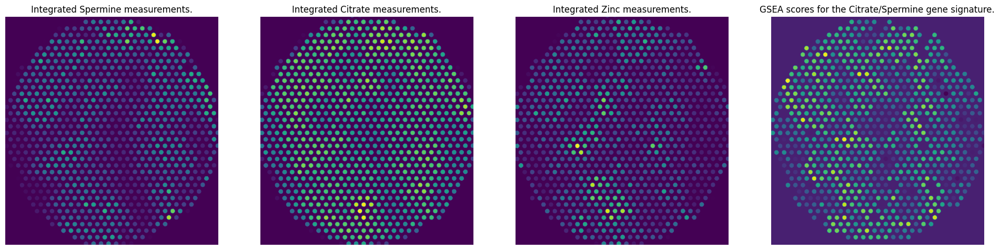

In [11]:
fig, axs = plt.subplots(1, 4, figsize=(24, 6))
for ax in axs:
    ax.axis('off')
axs[0].imshow(spermine_mat)
axs[0].set_title('Integrated Spermine measurements.')
axs[1].imshow(citrate_mat)
axs[1].set_title('Integrated Citrate measurements.')
axs[2].imshow(zinc_mat)
axs[2].set_title('Integrated Zinc measurements.')
axs[3].imshow(csgs_mat)
axs[3].set_title('GSEA scores for the Citrate/Spermine gene signature.')

First, we plot the integrated annotations.

Text(0.5, 1.0, 'Stroma distribution.')

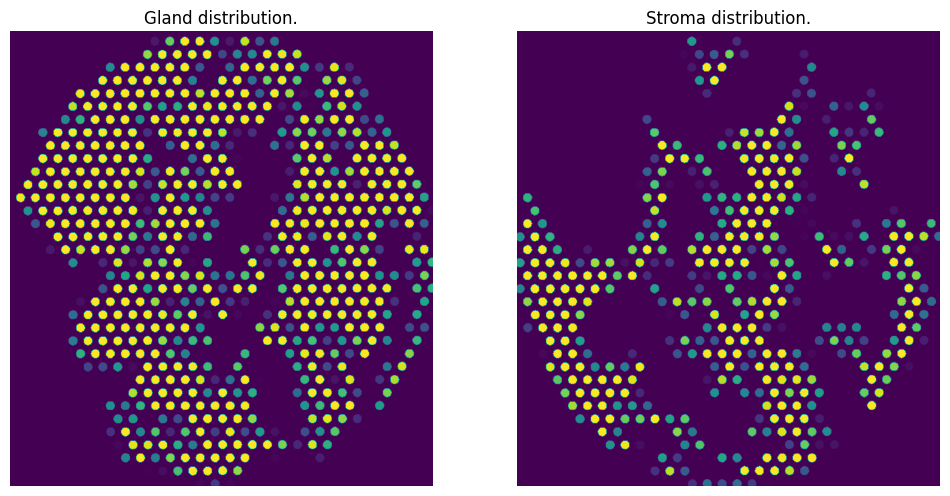

In [15]:
gland_mat = convert_table_to_mat(integrated_annotations, st_data, 'gland')
stroma_mat = convert_table_to_mat(integrated_annotations, st_data, 'stroma')

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
for ax in axs:
    ax.axis('off')
axs[0].imshow(gland_mat)
axs[0].set_title('Gland distribution.')
axs[1].imshow(stroma_mat)
axs[1].set_title('Stroma distribution.')

Then we assign each spot a discrete tissue class (gland or stroma).

In [31]:
# We add the barcode column for the spot_coloring_function. Otherwise there is not point in using it.
integrated_annotations_df = integrated_annotations[integrated_annotations.tissue > 0.8]
integrated_annotations_df.drop(['tissue'], axis=1, inplace=True)
integrated_annotations_df = pd.DataFrame(integrated_annotations_df.idxmax(1))
integrated_annotations_df['barcode'] = integrated_annotations_df.index

colored_spot_mat = get_spot_coloring_img(integrated_annotations_df, st_data.ref_mat.data, st_data.table.data, col=0)
plt.imshow(colored_spot_mat)
plt.axis('off')
plt.title('Distribution of stroma (blue) and glands (orange).')

/tmp/ipykernel_4265/2418986204.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  integrated_annotations_df.drop(['tissue'], axis=1, inplace=True)


,0,barcode
TATAACTTGGTCCCTT-1,Benign hyperplasia (BH),TATAACTTGGTCCCTT-1
CTAAATAAACACAGGC-1,Benign hyperplasia (BH),CTAAATAAACACAGGC-1
GCATACCACAAATTAA-1,gland,GCATACCACAAATTAA-1
AGATACGCAGGATCTT-1,gland,AGATACGCAGGATCTT-1
TGCTCGGGTATCGGAA-1,gland,TGCTCGGGTATCGGAA-1
...,...,...
GTTATTACCGTGCGGT-1,stroma,GTTATTACCGTGCGGT-1
GTTAACTGATTCGGAA-1,stroma,GTTAACTGATTCGGAA-1
ATAGGAACATTGCGGC-1,stroma,ATAGGAACATTGCGGC-1
GGGGACAAGTGGCAAT-1,stroma,GGGGACAAGTGGCAAT-1


Next, we create the "wrongly" registered data.

In [17]:
st_section = Section.load(join(warped_section_directory, 'st_section'))
wrong_st_section = make_wrong_integration_section(st_section)

Text(0.5, 1.0, 'Histology Image - wrong rotation')

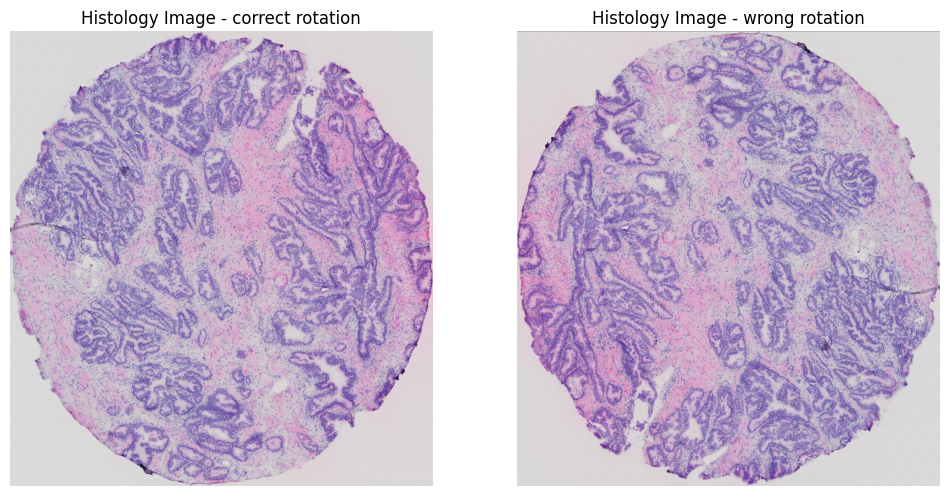

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(6 * 2, 6 * 1))
for ax in axs:
    ax.axis('off')
axs[0].imshow(st_section.reference_image.data)
axs[0].set_title('Histology Image - correct rotation')
axs[1].imshow(wrong_st_section.reference_image.data)
axs[1].set_title('Histology Image - wrong rotation')

In [31]:
msi_neg_section.get_annotations_by_names('tissue_classes').labels

['Empty',
 'Stroma',
 'Normal Glands',
 'ISUP1',
 'ISUP2',
 'ISUP3',
 'ISUP4',
 'ISUP5',
 'ISUPY',
 'ISUPX',
 'Lymphocytes',
 'Lymphocyte_enriched_stroma',
 'PNI',
 'PIN',
 'Tissue',
 'Vessel',
 'Stone',
 'Uncertain',
 'Lumen']

In [32]:
# Do matching/verlapping here.